Instalando o pacote Process Mining for Python

In [1]:
!pip install pm4py

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.8 MB 5.1 MB/s 
     |████████████████████████████████| 1.6 MB 37.7 MB/s 
  Created wheel for pyvis: filename=pyvis-0.2.1-py3-none-any.whl size=23688 sha256=611456b4cd526fcc0fa7a58d4aabb47fb0bd83ebd81f754bd31d8f538f388f81
  Stored in directory: /root/.cache/pip/wheels/2a/8f/04/6340d46afc74f59cc857a594ca1a2a14a1f4cbd4fd6c2e9306
  Created wheel for stringdist: filename=StringDist-1.0.9-cp37-cp37m-linux_x86_64.whl size=23611 sha256=8b604cb0e93e2313be1a09a40d8d51b17d3e5d59cf7308b170104f34be75e941
  Stored in directory: /root/.cache/pip/wheels/d7/9c/d4/63bc3d8931de0980b9e4a724dea290bb40b8b1b2bd6227c8da
Successfully built pyvis stringdist


Imports

In [8]:
import pm4py
import os
import datetime as dt
import pandas as pd
from pm4py.objects.log.obj import EventLog

É necessario converter as colunas de data para datetime na importação

In [3]:
log_file_path = "/content/log_2_geral_datas_distribuidas.csv"
columns_to_datetime = ["dt_fim", "dt_inicio"]
df = pd.read_csv(log_file_path, sep=',', encoding = "utf-8", parse_dates= columns_to_datetime)
df.head()

,tarefa,dt_inicio,demanda_id,cliente,tp_demanda,dt_fim
0,Estimar_Tamanho,2021-04-26 18:06:40,261,cliente1,evolutiva,2021-04-28 12:10:06
1,Validar_Requisitos,2021-04-26 18:11:42,261,cliente1,evolutiva,2021-04-28 01:56:57
2,Projetar_Arquitetura,2021-04-26 18:16:45,261,cliente1,evolutiva,2021-04-27 17:33:12
3,Projetar_Modelo_Dados,2021-04-26 18:21:46,261,cliente1,evolutiva,2021-04-30 13:58:17
4,Fisicalizar_Modelo_Dados,2021-04-26 18:26:47,261,cliente1,evolutiva,2021-04-30 14:33:04


Ajustes ao dataframe na entrega de Pedro Didier (pdm)



In [4]:
df = df.rename(columns={"tarefa" : "concept:tarefa",
                        "dt_inicio" : "time:inicio",
                        "demanda_id" : "case:concept:demanda_id",
                        "cliente" : "case:cliente",
                        "tp_demanda" : "tp_demanda",
                        "dt_fim" : "dt_fim"})

In [5]:
df = pm4py.format_dataframe(df, case_id='case:concept:demanda_id', 
                                activity_key='concept:tarefa', 
                                timestamp_key='time:inicio')

log = pm4py.convert_to_event_log(df) # Transformando em log

Descobrindo o processo com Heuristic Miner

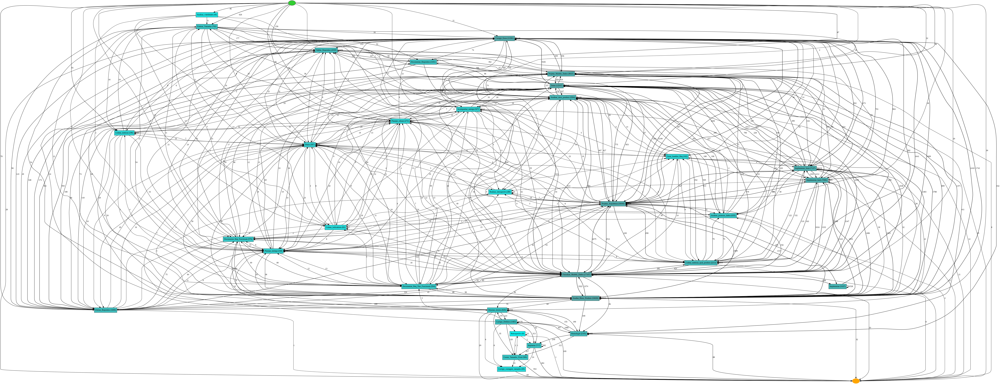

In [ ]:
heu_net = pm4py.discover_heuristics_net(log)
pm4py.view_heuristics_net(heu_net)

	RF2.1.3	Filtrar por Data de fim: demandas concluídas no último ano. Data de conclusão de atendimento da demanda (data de término da última tarefa)

	RF2.1.4	Retornar erro, caso a aplicação de um filtro resulte em 0 (zero) demandas recuperadas da base

O RF2.1.4 é na verdade: "Excluir filtro da interface caso a aplicação de um filtro resulte em 0 (zero) demandas recuperadas da base", mas não estou trabalhando com interface por enquanto, então usei o RF 2.1.4 do documento encontrado no redu

Crio um dicionário para armazenar as tarefas que encerram os processos (não usado)

In [ ]:
end_activities = pm4py.get_end_activities(log)
print("End activities: {}".format(end_activities))

End activities: {'Homologar': 88, 'Analise_Risco_Produto': 32, 'Implantar': 284, 'Corrigir_Defeitos': 109, 'Contar_Tamanho_Final': 554, 'Corrigir_Erros': 28, 'Corrigir_contagem_tamanho': 69, 'Implementar_front': 21, 'Implementar_back': 13, 'Reuniao_tecnica': 29, 'Projetar_Modelo_Dados': 8, 'Fisicalizar_Modelo_Dados': 33, 'Projetar_Arquitetura': 22, 'Testar': 15, 'Analisar_risco_produto': 12, 'Coletar_metricas_qual_produto': 8, 'Analisar_protecao_dados': 2, 'Elicitar_Requisitos': 1, 'Retrospectiva': 1}


Implementação RF2.1.3 

In [10]:
comeco = dt.datetime(2021, 1, 1)
fim = dt.datetime(2021, 12, 31)

log_filtrado = EventLog()


def filtrar_por_periodo(EventLog : log, log_filtrado, datetime : comeco, fim):
  for trace in log:
    last_event = trace[-1]
    if last_event["dt_fim"] >= (comeco) and last_event["dt_fim"] <= (fim):
      log_filtrado.append(trace)
  if (len(log_filtrado) == 0):
    print("ERRO, Filtro encontrou 0 demandas")
  return log_filtrado

log_no_periodo = filtrar_por_periodo(log, log_filtrado, comeco, fim)


In [ ]:
#for trace in log_no_periodo:
#  for event in trace:
#    print(event)

In [12]:
print("Quantidade de processos totais:", len(log))
print("Quantidade de processos que comecaram e terminaram em 2021:", len(log_no_periodo))

Quantidade de processos totais: 1329
Quantidade de processos que comecaram e terminaram em 2021: 623
